In [5]:
import os
import numpy as np
import pandas as pd
import pickle
import re

from sklearn.cluster import DBSCAN, SpectralClustering, AgglomerativeClustering, KMeans
from sklearn.manifold import TSNE, trustworthiness
from sklearn.decomposition import TruncatedSVD, NMF, PCA, IncrementalPCA
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.neighbors import kneighbors_graph

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from collections import Counter
from nltk.corpus import stopwords
from wordcloud import WordCloud 

from functools import partial
from stop_words import get_stop_words
from string import punctuation
import warnings
warnings.filterwarnings('ignore')

In [15]:
def elbow_method(d, exp_name, model_name, save=False):
    ks = range(1, 20)
    inertias = []
    for k in ks:
        # Create a KMeans instance with k clusters: model
        model = KMeans(n_clusters=k)

        # Fit model to samples
        model.fit(d)

        # Append the inertia to the list of inertias
        inertias.append(model.inertia_)

    plt.rc('axes', titlesize=16)
    plt.plot(ks, inertias, '-o', color='royalblue')
    plt.xlabel('Počet shluků, k', fontsize=14)
    plt.ylabel('Hodnota ztrátové funkce', fontsize=14)
    plt.xticks(ks)
    plt.tight_layout()
    if save:
        os.makedirs(os.path.join('saved_models', exp_name, model_name), exist_ok=True)
        field_name = field.split("-")[0].strip()
        plt.savefig(os.path.join('saved_models', exp_name, model_name, f'elbow_{field_name}.png'))
    plt.show()

In [16]:
def plot_dendrogram(d, exp_name, model_name, save=False):
    linked = linkage(d, 'complete', metric='cosine')

    plt.figure(figsize=(10, 7))
    dendrogram(linked,
                orientation='top',
                labels=None,
                distance_sort='descending',
                show_leaf_counts=False)

    plt.rc('axes', labelsize=20)
    plt.xlabel('')
    plt.ylabel('Hodnota vazební funkce')
    plt.xticks([])
    plt.grid(b=False)
    plt.tight_layout()
    if save:
        os.makedirs(os.path.join('saved_models', exp_name, model_name), exist_ok=True)
        field_name = field.split("-")[0].strip()
        plt.savefig(os.path.join('saved_models', exp_name, model_name, f'dendrogram_{field_name}.png'))
    plt.show()

In [17]:
sw = get_stop_words('cz')
sw += get_stop_words('en')
sw = set(sw)
def remove_punctuation(arr):
    return [w for w in arr.split() if w not in punctuation]

def remove_stopwords(x, mc):
    ssw = sw.union(set(mc + ['and_obv_souč_anglických_názvů', '_a', 'XXX', 'DNA']))
    new_sentence = []
    for word in x:
        if word not in ssw:
            new_sentence.append(word.strip())
    return ' '.join(new_sentence)

In [18]:
def visualize_clusters(cluster_results, exp_name, model_name, save=False):
    fig, axes = plt.subplots(3, 2, figsize=(10, 14))
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.rc('axes', titlesize=16)
    for idx, (name, clusters) in enumerate(cluster_results.items()):
        dfo[name] = clusters
        dfo['c'] = dfo[name].map({i:colors[i] if i < len(colors) else colors[-1] for i in clusters})
        cluster_labels = {i:f'Shluk {i}' if i >= 0 and i < len(colors) else 'Odlehlá pozorování' for i in set(clusters)}
        axes[idx // 2][idx % 2].scatter(x=two_dim_tsne[:, 0], y=two_dim_tsne[:, 1], 
                                        c=dfo['c'], alpha=.8)
        axes[idx // 2][idx % 2].set_title(name)
        legend_elements = [plt.Line2D([0], [0], marker='o', color='w', 
                                      label=label, markerfacecolor=colors[i], 
                                      markersize=5)
                          for i, label in cluster_labels.items()]
        axes[idx // 2][idx % 2].legend(handles=legend_elements, loc='upper right')
    plt.tight_layout()
    if save:
        os.makedirs(os.path.join('saved_models', exp_name, model_name), exist_ok=True)
        field_name = field.split("-")[0].strip()
        plt.savefig(os.path.join('saved_models', exp_name, model_name, f'tsne_clusters_{field_name}.png'))
    plt.show()

In [19]:
def create_wordclouds(cluster_results, key, exp_name, model_name, save=False):
    alg_names = list(cluster_results.keys())
    n_algs = len(alg_names)
    fig, axes = plt.subplots(n_clusters, n_algs, figsize=(5 * n_algs, 4 * n_clusters))
    plt.rc('axes', titlesize=24)
    for j, alg_name in enumerate(cluster_results.keys()):
        for i in range(n_clusters):
            cluster = dfo[dfo[alg_name] == i][key]
            counts = Counter(' '.join(cluster).split())
            cluster = cluster.apply(remove_punctuation)
            mc = [t[0] for t in counts if len(t[0]) <= 2]
            cluster = cluster.apply(lambda x: remove_stopwords(x, mc))
            most_common = Counter(' '.join(cluster.str.replace('[^\w\s]','')).split()).most_common(30)
            if len(most_common) < 1:
                continue
            wc = WordCloud(width=400, height=400, background_color="white")
            wordcloud = wc.generate_from_frequencies(dict(most_common))
            axes[i][j].imshow(wordcloud, interpolation='bilinear')
            axes[i][j].set_xticks([])
            axes[i][j].set_yticks([])
            axes[i][j].set_xlabel('')
            axes[i][j].set_ylabel('')

    for ax, name in zip(axes[0], alg_names):        
        ax.set_title(name)
    for ax, i in zip(axes[:, 0], range(n_clusters)):        
        ax.set_ylabel(f'Shluk {i}', fontsize=24)
    plt.tight_layout()
    if save:
        os.makedirs(os.path.join('saved_models', exp_name, model_name), exist_ok=True)
        field_name = field.split("-")[0].strip()
        plt.savefig(os.path.join('saved_models', exp_name, model_name, f'wordclouds_{field_name}.png'))
    plt.show()

In [11]:
os.listdir('saved_models/')

['w2v_d2v_kwords_lemmatize',
 'tf_w2v_d2v_fast_cz_nolemma_naz_anot_obor_uc_res_pos_2',
 'ud_pipe_czech_text',
 'tf_w2v_d2v_fast_eng_n_a_kwords_2',
 'tf_w2v_d2v_fast_eng_n_a_kwords',
 'tf_w2v_d2v_fast_cz_nolemma_naz_anot_obor_uc_res_pos',
 'ud_pipe_nazev_anotace_stopwords',
 'd2v_w2v_kwords_nolemma']

In [24]:
exp_name = 'tf_w2v_d2v_fast_cz_nolemma_naz_anot_obor_uc_res_pos_2'
with open(os.path.join('saved_models', exp_name, 'vectors.pickle'), 'rb') as handle:
    vectors = pickle.load(handle)

In [25]:
vectors.keys()

dict_keys(['tf-idf_(1,1)', 'tf-idf_(1,2)', 'tf-idf_(1,3)', 'tf-idf_(1,4)', 'tf-idf_(1,5)', 'tf-idf_(2,2)', 'tf-idf_(2,3)', 'tf-idf_(2,4)', 'tf-idf_(2,5)', 'tf-idf_(3,3)', 'tf-idf_(3,4)', 'tf-idf_(3,5)', 'tf-idf_(4,4)', 'tf-idf_(4,5)', 'tf-idf_(5,5)', 'word2vec_25_5', 'word2vec_25_10', 'word2vec_25_25', 'word2vec_25_50', 'word2vec_50_5', 'word2vec_50_10', 'word2vec_50_25', 'word2vec_50_50', 'word2vec_100_5', 'word2vec_100_10', 'word2vec_100_25', 'word2vec_100_50', 'word2vec_200_5', 'word2vec_200_10', 'word2vec_200_25', 'word2vec_200_50', 'fasttext_25_5', 'fasttext_25_10', 'fasttext_25_25', 'fasttext_25_50', 'fasttext_50_5', 'fasttext_50_10', 'fasttext_50_25', 'fasttext_50_50', 'fasttext_100_5', 'fasttext_100_10', 'fasttext_100_25', 'fasttext_100_50', 'fasttext_200_5', 'fasttext_200_10', 'fasttext_200_25', 'fasttext_200_50', 'doc2vec_25_5', 'doc2vec_25_10', 'doc2vec_25_25', 'doc2vec_25_50', 'doc2vec_50_5', 'doc2vec_50_10', 'doc2vec_50_25', 'doc2vec_50_50', 'doc2vec_100_5', 'doc2vec_100_1

Scaling
Transforming


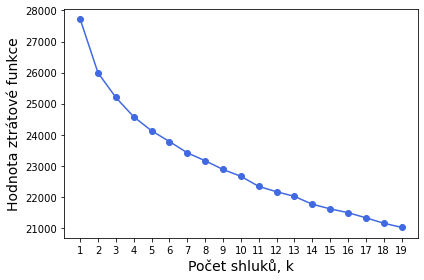

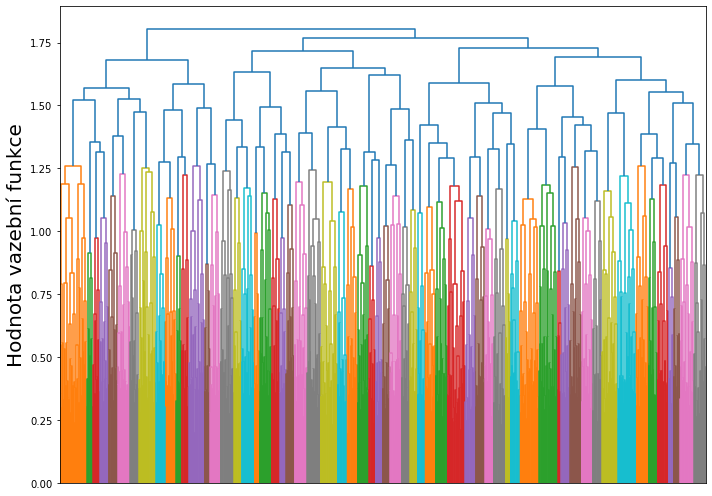

Using KMeans
Using Ward
Using AggAvg
Using spectral
Using DBSCAN


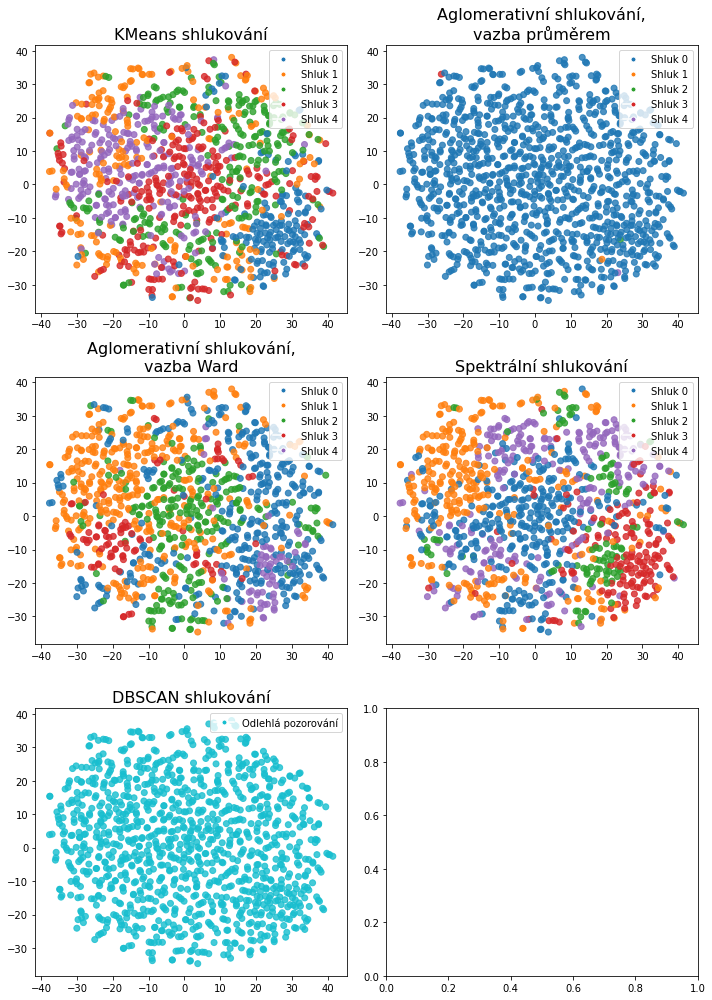

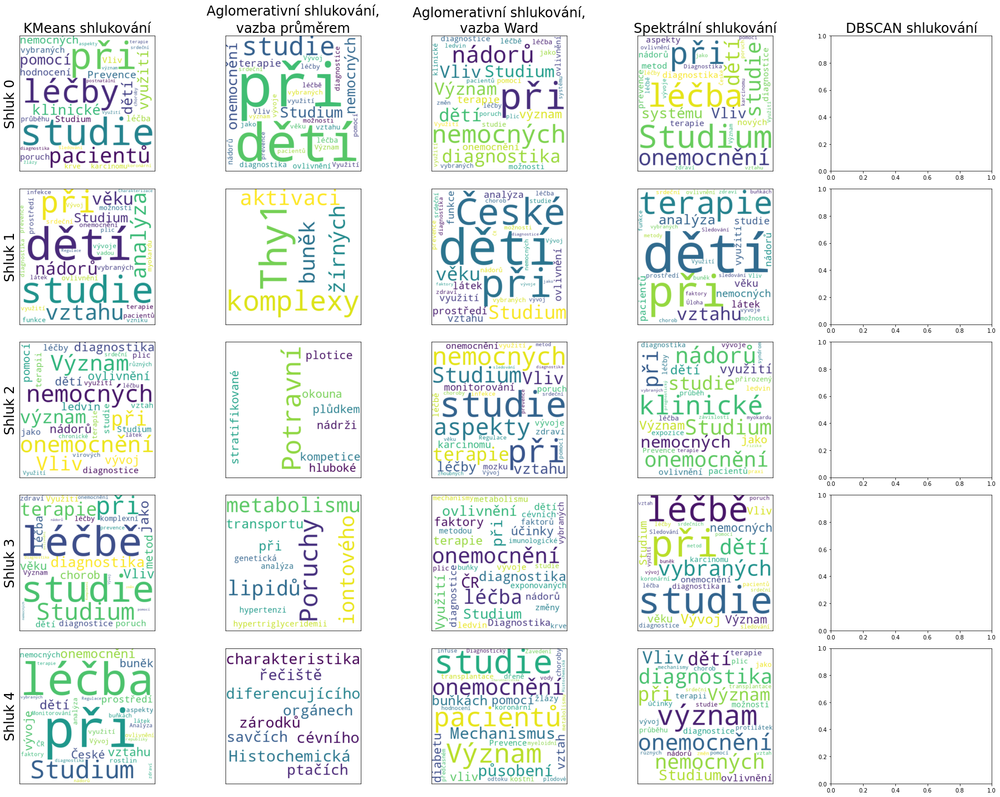

Scaling
Transforming


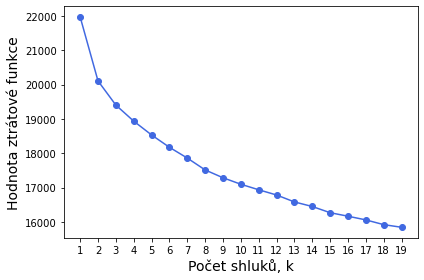

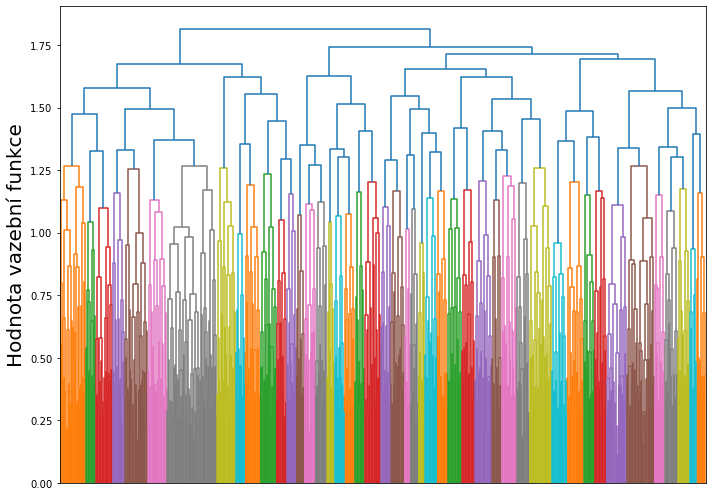

Using KMeans
Using Ward
Using AggAvg
Using spectral
Using DBSCAN


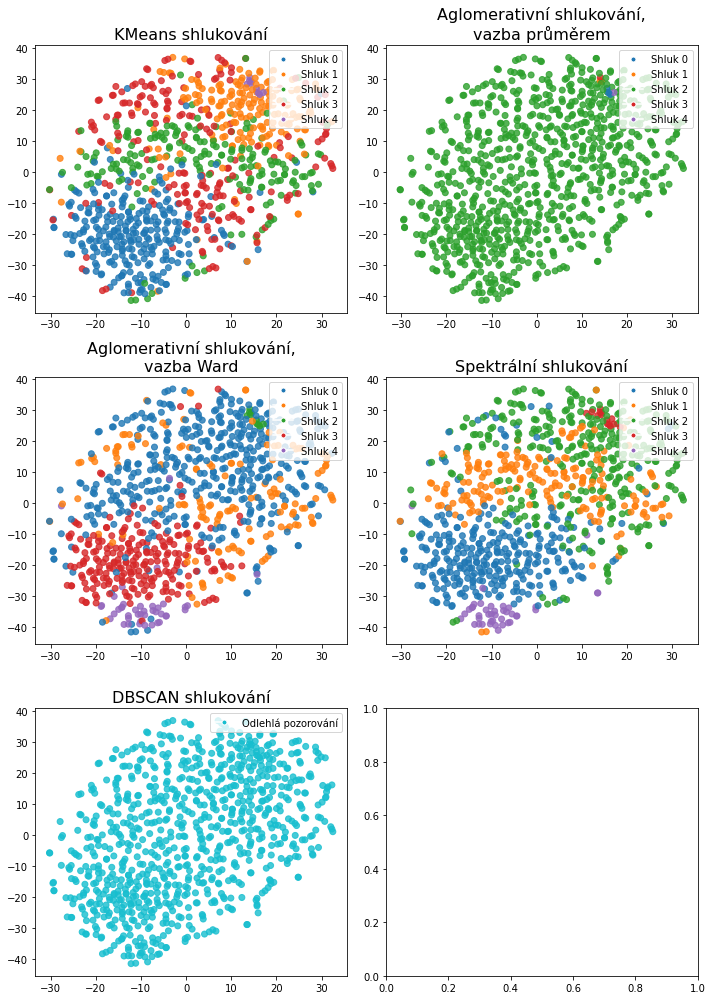

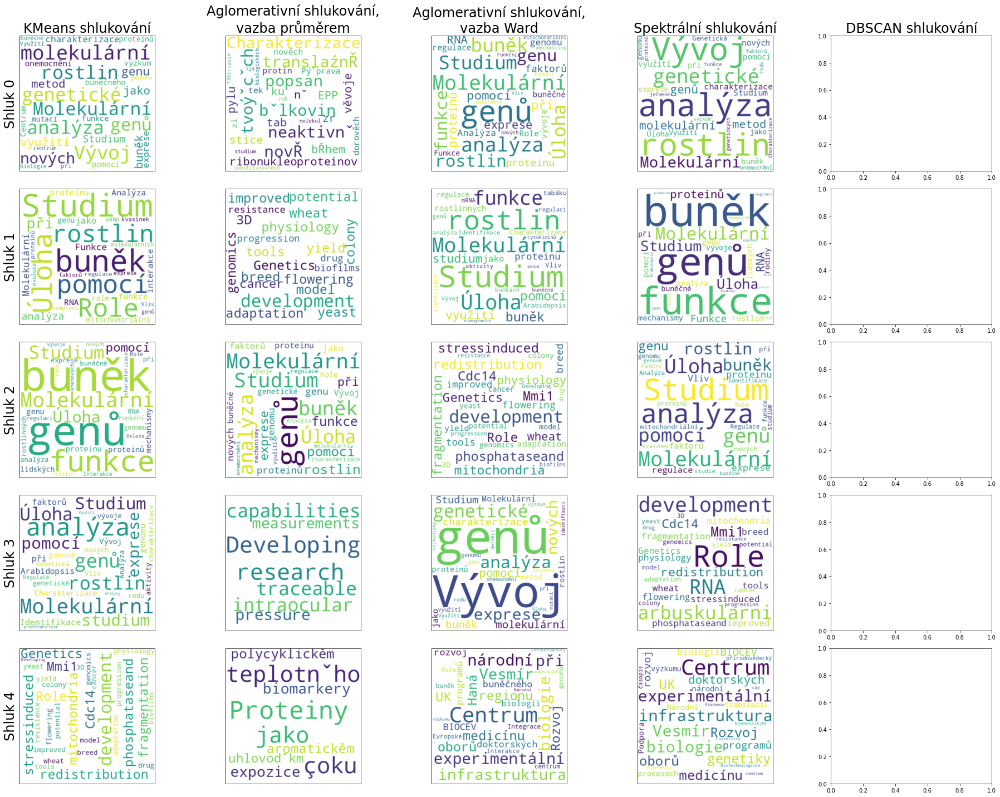

Scaling
Transforming


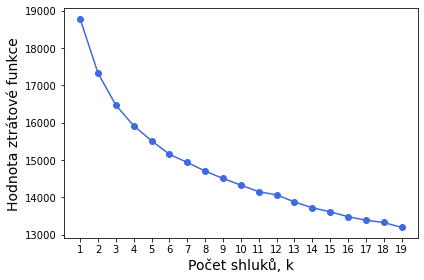

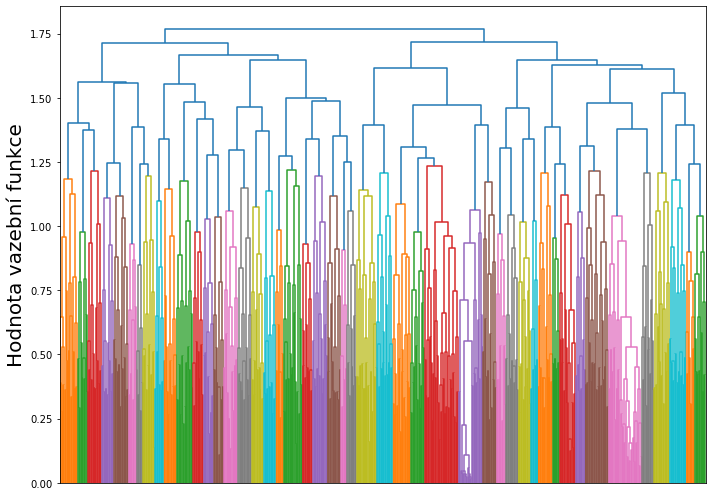

Using KMeans
Using Ward
Using AggAvg
Using spectral
Using DBSCAN


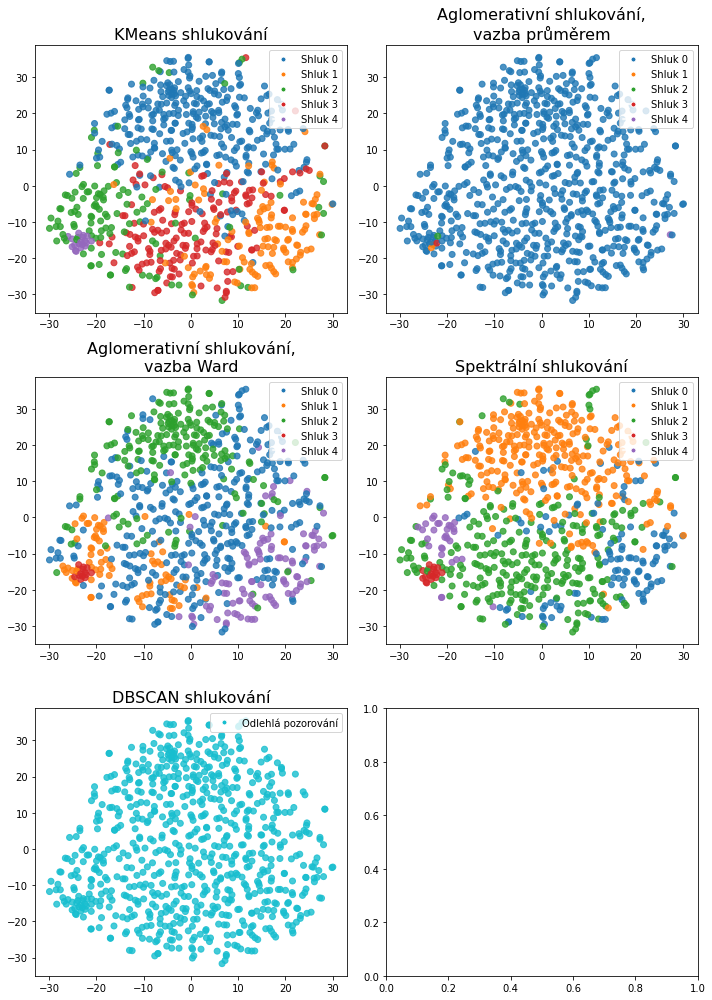

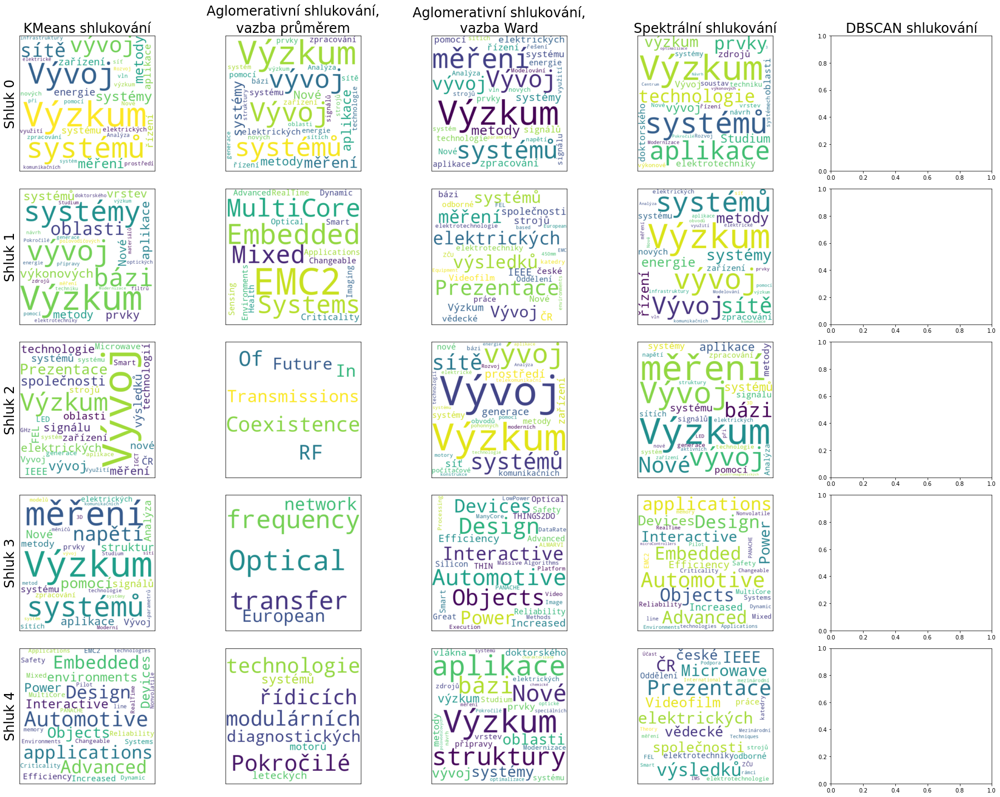

Scaling
Transforming


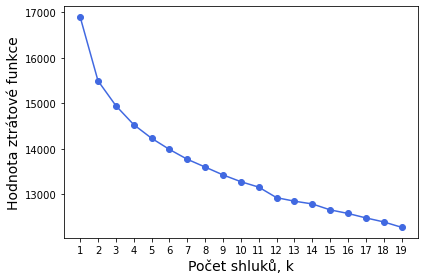

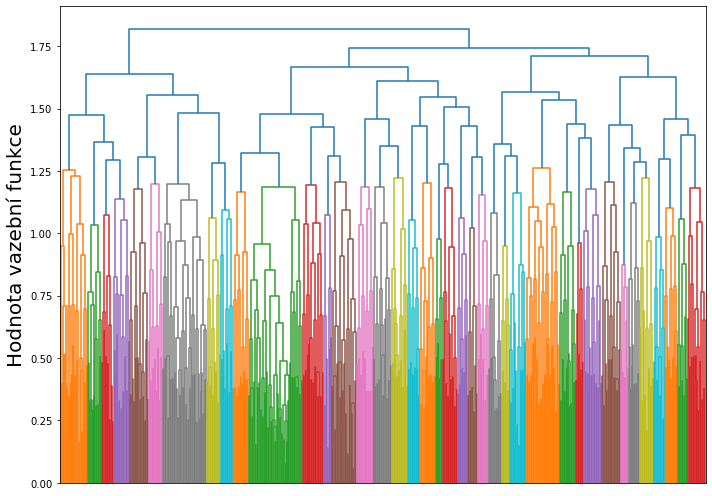

Using KMeans
Using Ward
Using AggAvg
Using spectral
Using DBSCAN


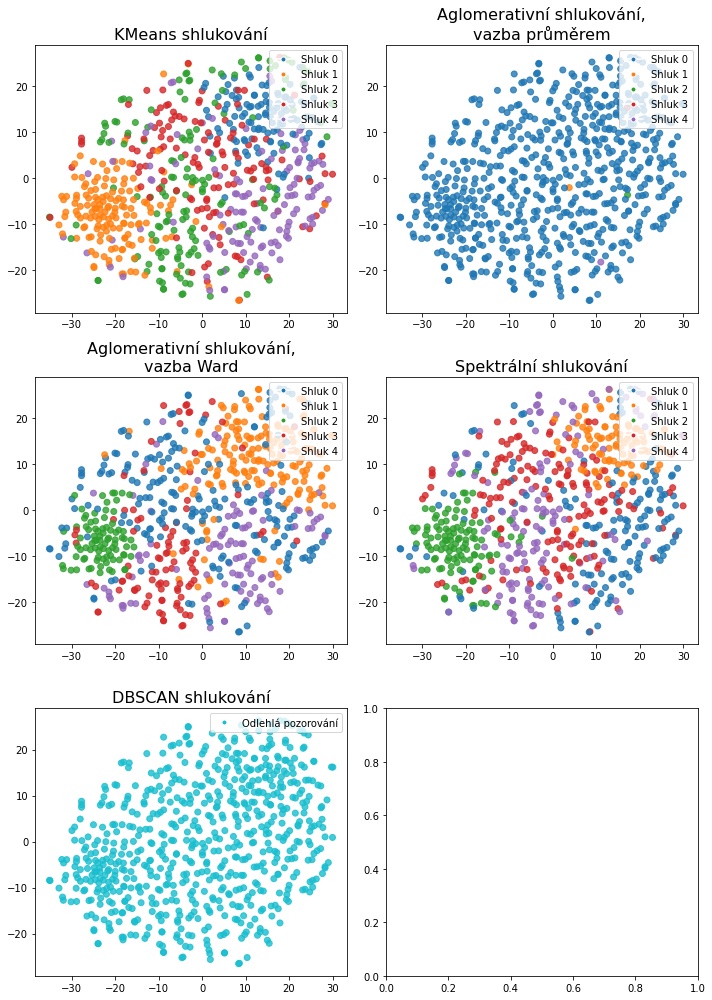

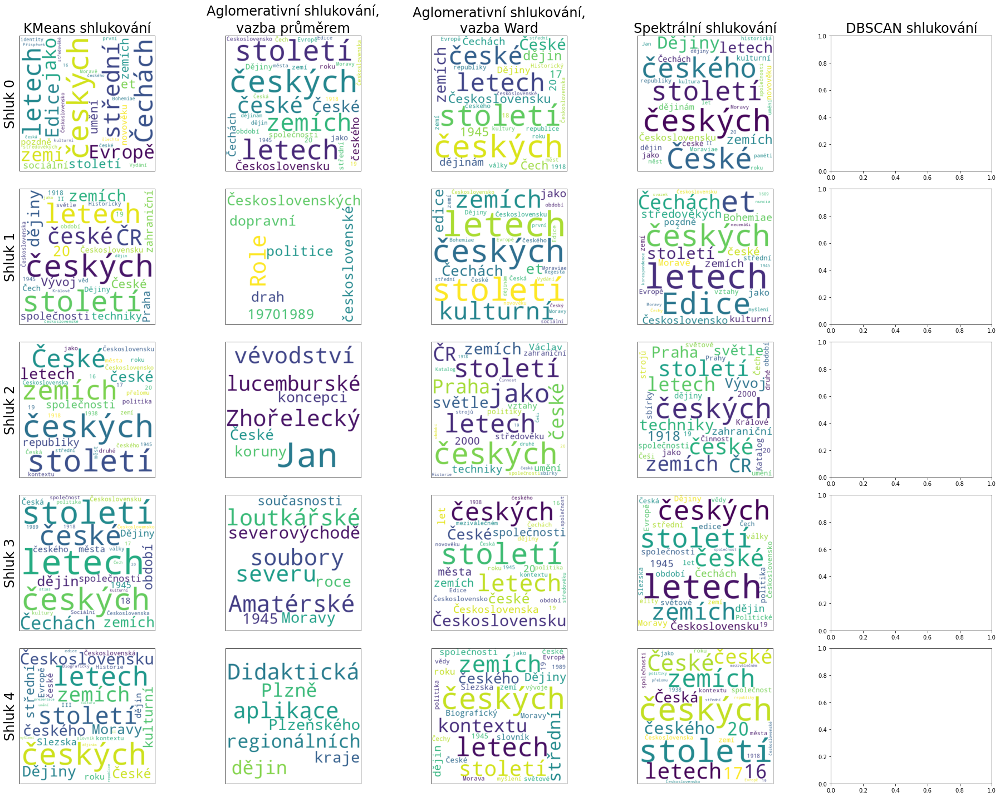

Scaling
Transforming


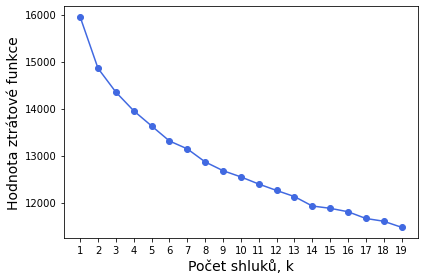

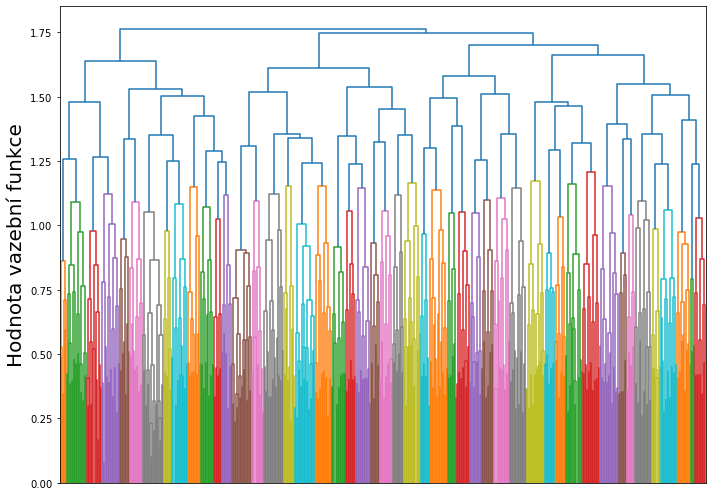

Using KMeans
Using Ward
Using AggAvg
Using spectral
Using DBSCAN


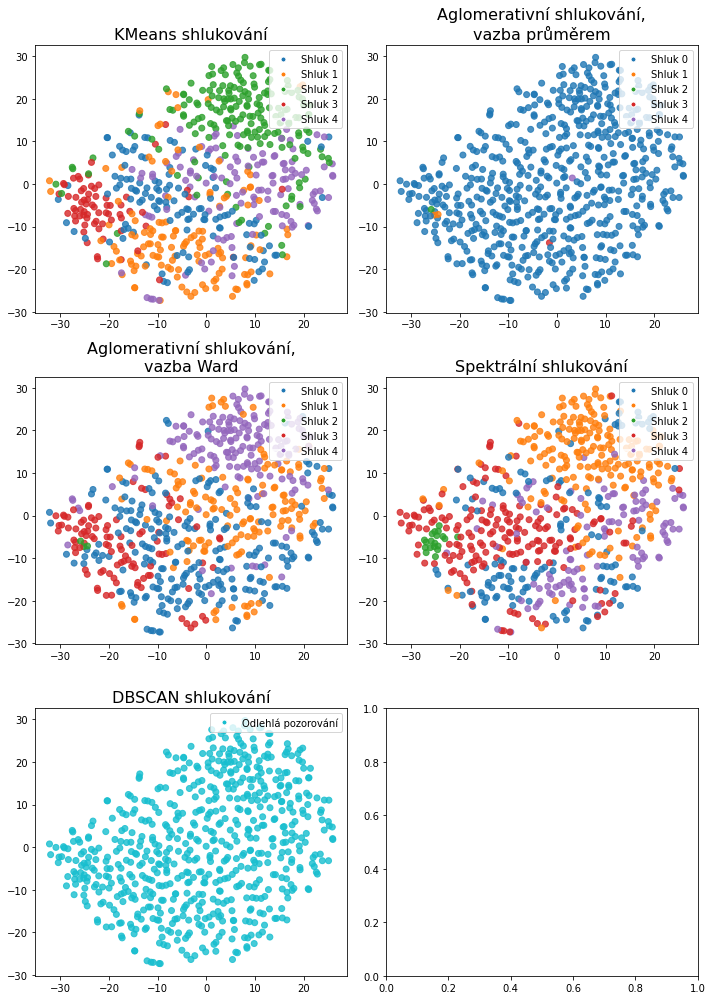

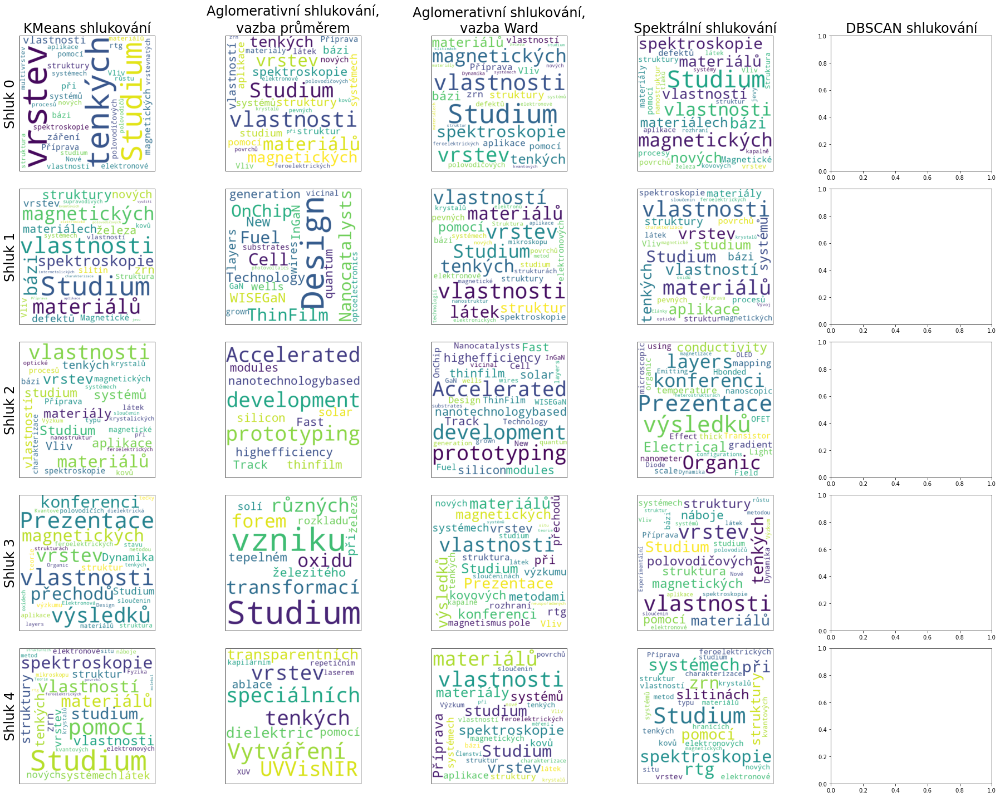

In [28]:
model_name = 'doc2vec_25_5'
data = vectors[model_name]
df = pd.read_csv('../data/TACR_Starfos_isvav_project.csv')
np.random.seed(42)
n_clusters = 5
n_neighbors = 10
save = True

nan_rows = df[['Název česky', 'Anotace česky', 'Hlavní CEP obor', 'Podrobné informace o účastnících', 'Hlavní řešitelé', 'Poskytovatel']].isna().any(axis=1)
df = df[~nan_rows]
df.reset_index(inplace=True, drop=True)
counts = Counter(df['Hlavní CEP obor']).most_common(10)
fields = [t[0] for t in counts if t[0] is not np.nan]
fields = fields[:5]
for field in fields:
    dfo = df[df['Hlavní CEP obor'] == field]
    idxs = dfo.index
    sample_data = data[idxs]

    # Scale
    print('Scaling')
    scaler = StandardScaler()
    scaled = scaler.fit_transform(sample_data)

    print('Transforming')
    #pca = PCA(n_components=20, random_state=42, whiten=True)
    svd = TruncatedSVD(n_components=50, random_state=42)
    tsne = TSNE(perplexity=30, random_state=42, metric='cosine')
    #nmf = NMF(n_components=n_clusters, random_state=42)
    #svd_trans = svd.fit_transform(scaled)
    svd_trans = scaled
    #nmf_trans = nmf.fit_transform(sample_data)
    two_dim_tsne = tsne.fit_transform(svd_trans)

    elbow_method(svd_trans, exp_name, model_name, save=save)
    
    plot_dendrogram(svd_trans, exp_name, model_name, save=save)
    
    #print('Using NMF')
    #nmf_clusters = nmf_trans.argmax(axis=1)

    print('Using KMeans')
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_clusters = kmeans.fit_predict(svd_trans)

    connectivity = kneighbors_graph(svd_trans, n_neighbors=n_neighbors, include_self=False)

    print('Using Ward')
    ward = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity)
    ward_culsters = ward.fit_predict(svd_trans)

    print('Using AggAvg')
    avg = AgglomerativeClustering(n_clusters=n_clusters, linkage='average', 
                                  connectivity=connectivity)
    avg_clusters = avg.fit_predict(svd_trans)

    print('Using spectral')
    spectral = SpectralClustering(n_clusters=n_clusters, n_neighbors=n_neighbors, eigen_solver='arpack', 
                                  random_state=42, affinity='nearest_neighbors')
    spectral_clusters = spectral.fit_predict(svd_trans)

    print('Using DBSCAN')
    db = DBSCAN(eps=0.2, min_samples=20, metric='cosine')
    db_clusters = db.fit_predict(svd_trans)

    cluster_results = {
        #'NMF shlukování': nmf_clusters, 
        'KMeans shlukování': kmeans_clusters, 
        'Aglomerativní shlukování,\nvazba průměrem': avg_clusters, 
        'Aglomerativní shlukování,\nvazba Ward': ward_culsters, 
        'Spektrální shlukování': spectral_clusters, 
        'DBSCAN shlukování': db_clusters
    }

    # Visualize
    visualize_clusters(cluster_results, exp_name, model_name, save=save)
    
    create_wordclouds(cluster_results, 'Název česky', exp_name, model_name, save=save)

In [96]:
df = pd.read_csv('../data/TACR_Starfos_isvav_project.csv')
df = df[['Název česky', 
               'Anotace česky', 
               'Hlavní CEP obor', 
               'Podrobné informace o účastnících', 
               'Hlavní řešitelé',
               'Poskytovatel']]
nan_rows = df.isna().any(axis=1)
df = df[~nan_rows]
df.reset_index(inplace=True, drop=True)
df

,Název česky,Anotace česky,Hlavní CEP obor,Podrobné informace o účastnících,Hlavní řešitelé,Poskytovatel
0,"Frekvence a distribuce inzulinorezistence, jak...",Stanovení jednoduchých kvantitativních indexů ...,"FB - Endokrinologie, diabetologie, metabolismu...",Univerzita Palackého v Olomouci / Lékařská fak...,prof. MUDr. Vladimír Janout CSc. (vedidk=25123...,MZ - Ministerstvo zdravotnictví
1,13 let jako významný milník v životě dětí - ep...,Budou šetřeny výzkumné děti ve 13 letech jejic...,FM - Hygiena,Masarykova univerzita / Lékařská fakulta (ico:...,MUDr. Lubomír Kukla CSc. (vedidk=5814871),MZ - Ministerstvo zdravotnictví
2,Modely financování opatření k ochraně životníh...,Navrhnout model financování aspektů životního ...,AH - Ekonomie,Allowance s.r.o. (ico: 26140136; forma: POO - ...,Mgr. Drahomír Mezr (vedidk=6748791),MŽP - Ministerstvo životního prostředí
3,Ověření účinnosti dobrovolných nástrojů ochran...,Dosažení cílů udržitelného rozvoje a kvality ž...,"DM - Tuhý odpad a jeho kontrola, recyklace",ČESKÉ EKOLOGICKÉ MANAŽERSKÉ CENTRUM (ico: 4524...,PhDr. Věra Havránková (vedidk=3579417),MŽP - Ministerstvo životního prostředí
4,Aplikace environmentálního účetnictví na mikro...,Projekt řeší problematiku udržitelného rozvoje...,EH - Ekologie – společenstva,ČESKÉ EKOLOGICKÉ MANAŽERSKÉ CENTRUM (ico: 4524...,Ing. Jiří Študent (vedidk=5621542),MŽP - Ministerstvo životního prostředí
...,...,...,...,...,...,...
17615,Vývoj metodiky digitálního zpracování multispe...,Cílem je připravit nové metodiky digitálního z...,"JE - Nejaderná energetika, spotřeba a užití en...",HELP SERVICE-MAPPING s.r.o. (ico: 45278644; fo...,RNDr. Karel Charvát (vedidk=7716664); Ing. Zde...,MŽP - Ministerstvo životního prostředí
17616,"Česká republika 1:200 000, vývoj účelových vrs...","Cílem projektu je pořízení, zpracování a vyhod...",DO - Ochrana krajinných území,HELP SERVICE-MAPPING s.r.o. (ico: 45278644; fo...,RNDr. Karel Charvát (vedidk=7716664); Ing. Sta...,MŽP - Ministerstvo životního prostředí
17617,Výzkum a vývoj vědeckých podkladů kvantifikace...,"Systémové vymezení zdrojů emisí těžkých kovů, ...",DI - Znečištění a kontrola vzduchu,"EGÚ Praha Engineering, a.s. (ico: 25663399; fo...",RNDr. Milan Fara CSc. (vedidk=2984806),MŽP - Ministerstvo životního prostředí
17618,Zřízení a provádění národního programu snižová...,Posouzení účinků PROTOKOLU o snižování emisí V...,DI - Znečištění a kontrola vzduchu,SVÚOM Praha a. s. v likvidaci (ico: 60193395; ...,Ing. Václav Trojan (vedidk=5127076); Ing. Pave...,MŽP - Ministerstvo životního prostředí


In [39]:
counts

[('9F - 9', 1109),
 ('EB - Genetika a molekulární biologie', 879),
 ('JA - Elektronika a optoelektronika, elektrotechnika', 751),
 ('AB - Dějiny', 676),
 ('BM - Fyzika pevných látek a magnetismus', 638),
 ('AL - Umění, architektura, kulturní dědictví', 621),
 ('AH - Ekonomie', 518),
 ('AM - Pedagogika a školství', 515),
 ('BA - Obecná matematika', 485),
 ('AO - Sociologie, demografie', 484)]

In [ ]:
### from functools import partial
from stop_words import get_stop_words
from string import punctuation
import warnings
warnings.filterwarnings('ignore')

sw = get_stop_words('cz')
sw += get_stop_words('en')
sw = set(sw)
def remove_punctuation(arr):
    return [w for w in arr.split() if w not in punctuation]

def remove_stopwords(x, mc):
    ssw = sw.union(set(mc + ['and_obv_souč_anglických_názvů', '_a', 'XXX', 'DNA']))
    new_sentence = []
    for word in x:
        if word not in ssw:
            new_sentence.append(word.strip())
    return ' '.join(new_sentence)

alg_names = list(cluster_results.keys())
n_algs = len(alg_names)
fix, axes = plt.subplots(n_clusters, n_algs, figsize=(5 * n_algs, 4 * n_clusters))
plt.rc('axes', titlesize=24)
for j, alg_name in enumerate(cluster_results.keys()):
    for i in range(n_clusters):
        cluster = dfo[dfo[alg_name] == i]['Klíčová slova']
        counts = Counter(' '.join(cluster).split())
        cluster = cluster.apply(remove_punctuation)
        cluster = cluster.apply(lambda x: remove_stopwords(x, []))
        most_common = Counter(' '.join(cluster.str.replace('[^\w\s]','')).split()).most_common(30)
        if len(most_common) < 1:
                continue
        wc = WordCloud(width=400, height=400, background_color="white")
        wordcloud = wc.generate_from_frequencies(dict(most_common))
        axes[i][j].imshow(wordcloud, interpolation='bilinear')
        axes[i][j].set_xticks([])
        axes[i][j].set_yticks([])
        axes[i][j].set_xlabel('')
        axes[i][j].set_ylabel('')

for ax, name in zip(axes[0], alg_names):        
    ax.set_title(name)
for ax, i in zip(axes[:, 0], range(n_clusters)):        
    ax.set_ylabel(f'Shluk {i}', fontsize=24)
plt.tight_layout()
#plt.savefig('w2v_d2v_kwords_lemmatize_1000_wc.png')
plt.show()

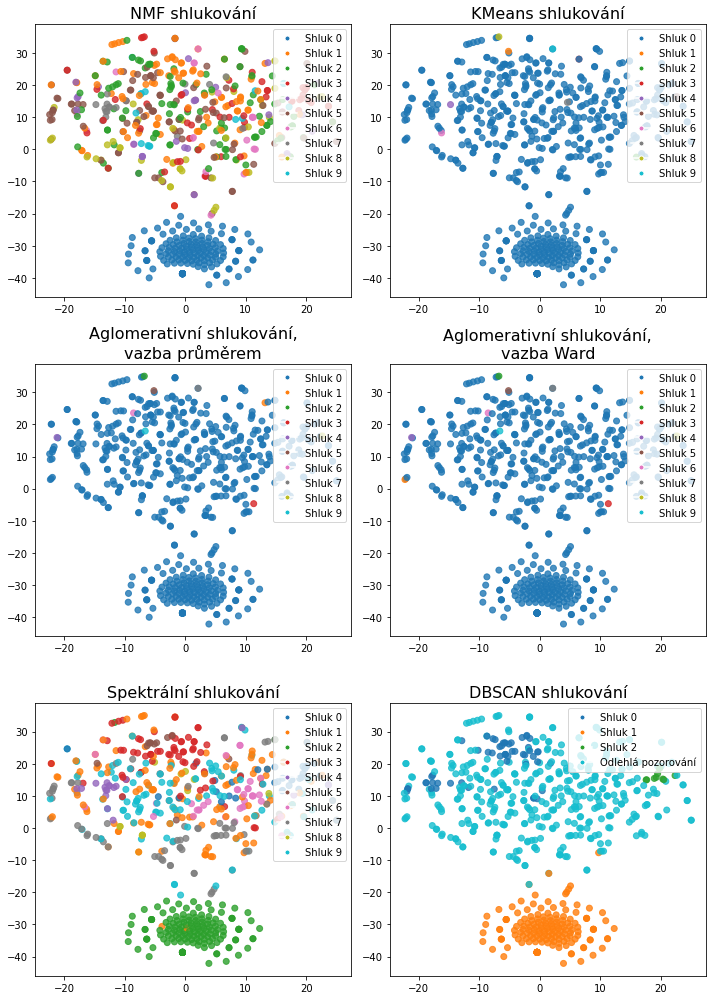

In [149]:
fig, axes = plt.subplots(3, 2, figsize=(10, 14))
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
plt.rc('axes', titlesize=16)
for idx, (name, clusters) in enumerate(cluster_results.items()):
    dfo[name] = clusters
    dfo['c'] = dfo[name].map({i:colors[i] for i in clusters})
    cluster_labels = {i:f'Shluk {i}' if i >= 0 else 'Odlehlá pozorování' for i in set(clusters)}
    axes[idx // 2][idx % 2].scatter(x=two_dim_tsne[:, 0], y=two_dim_tsne[:, 1], 
                                    c=dfo['c'], alpha=.8)
    axes[idx // 2][idx % 2].set_title(name)
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', 
                                  label=label, markerfacecolor=colors[i], 
                                  markersize=5)
                      for i, label in cluster_labels.items()]
    axes[idx // 2][idx % 2].legend(handles=legend_elements, loc='upper right')
plt.tight_layout()
#plt.savefig(f'saved_models/w2v_d2v_kwords_lemmatize/tsne_clusters_{field.split("-")[0].strip()}.png')
plt.show()

In [10]:
vectors['tf-idf_(1,1)']

<30554x8843203 sparse matrix of type '<class 'numpy.float64'>'
	with 15085391 stored elements in Compressed Sparse Row format>

In [15]:
df[['Název česky', 'Anotace česky', 'Hlavní CEP obor', 'Podrobné informace o účastnících', 'Hlavní řešitelé', 'Poskytovatel']].columns

Index(['Kód projektu', 'Název česky', 'Název anglicky', 'Anotace česky',
       'Anotace anglicky', 'Hlavní CEP obor', 'Vedlejší CEP obor',
       'Další vedlejší CEP obor', 'Hlavní FORD obor', 'Vedlejší FORD obor',
       'Další vedlejší FORD obor', 'Kategorie VaV', 'Hlavní účastníci',
       'Další účastníci', 'Výčet právních forem účastníků',
       'Výčet krajů účastníků', 'Výčet zemí účastníků',
       'Podrobné informace o účastnících', 'Hlavní řešitelé', 'Další řešitelé',
       'Klíčová slova', 'Výčet druhů dosažených výsledků', 'Poskytovatel',
       'Program', 'Uznané náklady', 'Podpora ze SR',
       'Ostatní veřejné zdroje fin.', 'Neveřejné zdroje fin.',
       'Začátek řešení', 'Konec řešení', 'URL v Starfose', 'Relevance'],
      dtype='object')

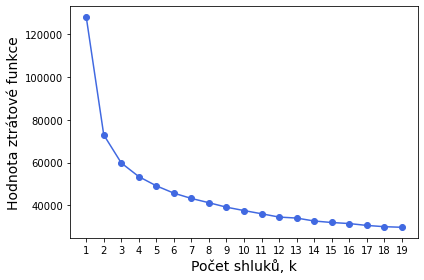

In [188]:
def elbow_method(d, save=False):
    ks = range(1, 20)
    inertias = []
    for k in ks:
        # Create a KMeans instance with k clusters: model
        model = KMeans(n_clusters=k)

        # Fit model to samples
        model.fit(d)

        # Append the inertia to the list of inertias
        inertias.append(model.inertia_)

    plt.rc('axes', titlesize=16)
    plt.plot(ks, inertias, '-o', color='royalblue')
    plt.xlabel('Počet shluků, k', fontsize=14)
    plt.ylabel('Hodnota ztrátové funkce', fontsize=14)
    plt.xticks(ks)
    plt.tight_layout()
    if save:
        plt.savefig('saved_models/w2v_d2v_kwords_lemmatize/elbow.png')
    plt.show()


In [241]:
from scipy.cluster import hierarchy

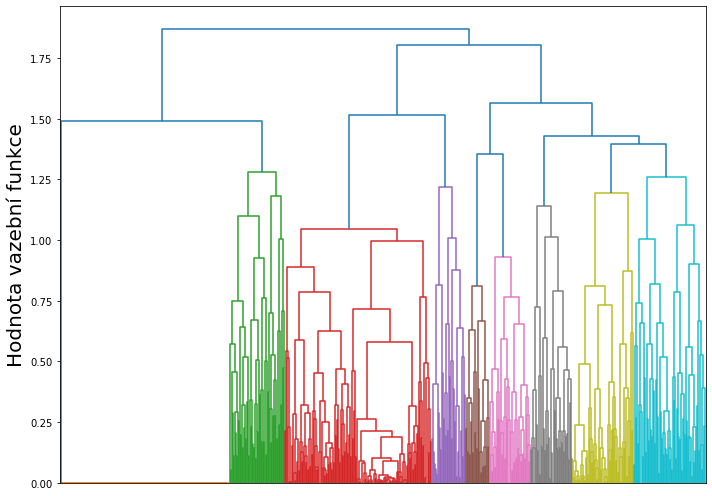

In [190]:
2

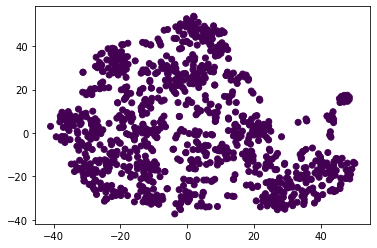

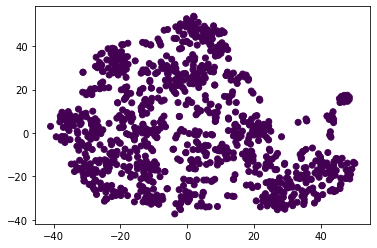

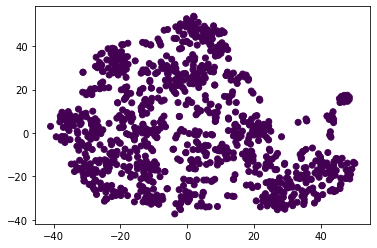

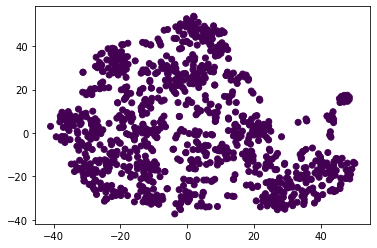

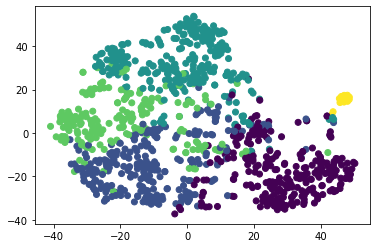

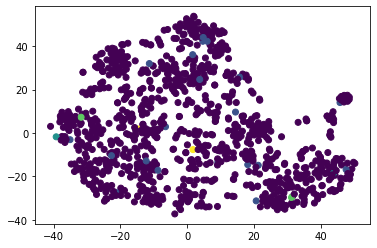

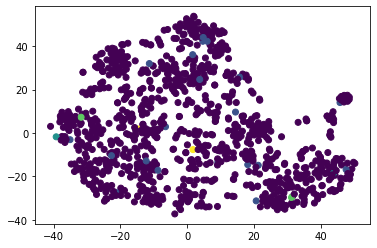

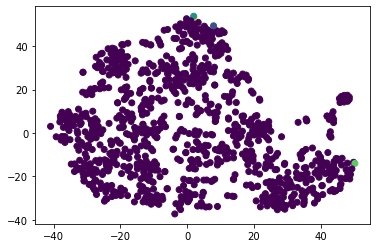

In [53]:
# Visualize
plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['DBSCAN1_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['DBSCAN2_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['DBSCAN3_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['DBSCAN4_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['KMeans_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['Avg_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['Ward_clusters'])
plt.show()

plt.scatter(x=df['X_tsne'], y=df['Y_tsne'], c=df['Spectral_clusters'])
plt.show()

In [4]:
', '.join(get_stop_words('cz'))

"ačkoli, ahoj, ale, anebo, ano, asi, aspoň, během, bez, beze, blízko, bohužel, brzo, bude, budeme, budeš, budete, budou, budu, byl, byla, byli, bylo, byly, bys, čau, chce, chceme, chceš, chcete, chci, chtějí, chtít, chut', chuti, co, čtrnáct, čtyři, dál, dále, daleko, děkovat, děkujeme, děkuji, den, deset, devatenáct, devět, do, dobrý, docela, dva, dvacet, dvanáct, dvě, hodně, já, jak, jde, je, jeden, jedenáct, jedna, jedno, jednou, jedou, jeho, její, jejich, jemu, jen, jenom, ještě, jestli, jestliže, jí, jich, jím, jimi, jinak, jsem, jsi, jsme, jsou, jste, kam, kde, kdo, kdy, když, ke, kolik, kromě, která, které, kteří, který, kvůli, má, mají, málo, mám, máme, máš, máte, mé, mě, mezi, mí, mít, mně, mnou, moc, mohl, mohou, moje, moji, možná, můj, musí, může, my, na, nad, nade, nám, námi, naproti, nás, náš, naše, naši, ne, ně, nebo, nebyl, nebyla, nebyli, nebyly, něco, nedělá, nedělají, nedělám, neděláme, neděláš, neděláte, nějak, nejsi, někde, někdo, nemají, nemáme, nemáte, neměl, němu